$$ ITI \space AI-Pro: \space Intake \space 45 $$
$$ Machine \space Learning \space 1 $$
$$ Obesity Risk  $$

# `01` Introduction

<img src="https://media3.giphy.com/media/nrTjHntgyF7OM/200.webp?cid=ecf05e47tgzu90f5bwpzzxfun0zg4kefnpsc3tpu3qn17963&ep=v1_gifs_search&rid=200.webp&ct=g" width="100%" height="100%">


---
- The dataset for this competition (both train and test) was generated from a deep learning model trained on the `Obesity` or `CVD risk` dataset.
- Feature distributions are close to, but not exactly the same, as the original.
- Feel free to use the original dataset as part of this competition, both to explore differences as well as to see whether incorporating the original in training improves model performance.

`Note`: This dataset is particularly well suited for visualizations, clustering, and general EDA. <br>
`Our Goal`: The goal of this competition is to use various factors to predict obesity risk in individuals, which is related to cardiovascular disease.

---

# `02` Data Set Overview 🔍

## `#` About Data:

The [Obesity or CVD risk dataset](https://www.kaggle.com/competitions/playground-series-s4e2/data) contains 14,530 rows and 17 columns.  


The columns are as follows :  

- **ID**: Unique identifier for each entry.  
- **Gender**: The biological sex of the individual (Male/Female).  
- **Age**: The age of the individual in years.  
- **Height**: The height of the individual in meters.  
- **Weight**: The weight of the individual in kilograms.  
- **family_history_with_overweight**: Indicates whether the individual has a family history of overweight (Yes/No).  
- **FAVC**: Indicates whether the individual frequently consumes high-calorie food (Yes/No).  
- **FCVC**: The frequency of vegetable consumption, on a scale from 1 (low) to 3 (high).  
- **NCP**: The number of main meals consumed per day.  
- **CAEC**: Frequency of eating between meals (Never, Sometimes, Frequently, Always).  
- **SMOKE**: Indicates whether the individual smokes (Yes/No).  
- **CH2O**: Daily water intake in liters.  
- **SCC**: Indicates whether the individual has a history of calorie consumption monitoring (Yes/No).  
- **FAF**: Physical activity frequency per week, on a scale from 0 (none) to 3 (high).  
- **TUE**: The time spent using electronic devices per day, on a scale from 0 (low) to 2 (high).  
- **CALC**: Frequency of alcohol consumption (Never, Sometimes, Frequently, Always).  
- **MTRANS**: The main mode of transportation used (e.g., Public_Transportation, Walking, Automobile, etc.).  

This dataset will help researchers understand lifestyle factors contributing to overweight and obesity and aid in building predictive models for health risk assessment.

---
## `#` Questions:
### <u>General Questions :</u>

- 1- Are there any missing values in our dataset?
- 2- Are there any duplicated values in our dataset?
- 3- What is the numerical description of our dataset?
- 4- What is the categorical description of our dataset?
- 5- What is the number of unique values in each column in our dataset?
- 6- Initial Data Assessment.
- 7- what is the distribution of each numerical columns?
- 8- what is the count of each categorical column?
- 9- Is there outliers in our data?

---
# `03` Import Necessary Libraries 📖

## `i` Default Libraries

In [2]:
import pandas as pd
import numpy as np

## `ii` Additional Libraries

In [3]:
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.linear_model import LogisticRegression , SGDClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, recall_score, f1_score

pd.set_option('display.max_columns', None)

import warnings
warnings.simplefilter("ignore")

----------------------------

# `04` Load Data

In [5]:
data = pd.read_csv('/content/train.csv')

In [6]:
data.head().style.background_gradient(cmap='Oranges')

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II


---
## `#` Create Test Set

In [7]:
x = data.drop(columns=['NObeyesdad','id'],axis=1)
y = data['NObeyesdad']

np.random.seed(42)

x_ , x_test ,y_, y_test = train_test_split(x,y ,stratify=y,test_size=0.15)
x_train, x_valid , y_train , y_valid = train_test_split(x_,y_,test_size=0.15/0.85)

----------------

# `05` Exploratory Data Analysis (EDA)

## `i` Simple Analysis

In [ ]:
# Do not forget to change column names

In [8]:
x_train.head().style.background_gradient(cmap='Oranges')

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS
3969,Male,30.304203,1.750000,120.021161,yes,yes,2.649406,3.000000,Sometimes,no,1.042989,no,1.076729,1.000000,Sometimes,Automobile
5624,Male,31.000000,1.740000,71.000000,yes,yes,3.000000,3.000000,Sometimes,no,2.000000,yes,3.000000,1.000000,Sometimes,Bike
3107,Male,18.000000,1.700000,70.000000,yes,yes,3.000000,3.000000,Frequently,no,2.000000,no,2.000000,1.000000,Sometimes,Public_Transportation
20386,Male,30.493946,1.683950,83.016968,yes,yes,2.766036,3.000000,Sometimes,no,2.000000,no,0.966973,0.000000,no,Automobile
113,Female,18.000000,1.650000,51.000000,yes,yes,3.000000,3.000000,Sometimes,no,2.000000,no,1.000000,1.000000,Sometimes,Public_Transportation


In [10]:
x_train.shape

(14530, 16)

In [9]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14530 entries, 3969 to 10741
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          14530 non-null  object 
 1   Age                             14530 non-null  float64
 2   Height                          14530 non-null  float64
 3   Weight                          14530 non-null  float64
 4   family_history_with_overweight  14530 non-null  object 
 5   FAVC                            14530 non-null  object 
 6   FCVC                            14530 non-null  float64
 7   NCP                             14530 non-null  float64
 8   CAEC                            14530 non-null  object 
 9   SMOKE                           14530 non-null  object 
 10  CH2O                            14530 non-null  float64
 11  SCC                             14530 non-null  object 
 12  FAF                             14

- There are no null data ,and the data types seem to be accurate :)

In [11]:
#Check Missing
x_train.isnull().sum() , y_train.isnull().sum()

(Gender                            0
 Age                               0
 Height                            0
 Weight                            0
 family_history_with_overweight    0
 FAVC                              0
 FCVC                              0
 NCP                               0
 CAEC                              0
 SMOKE                             0
 CH2O                              0
 SCC                               0
 FAF                               0
 TUE                               0
 CALC                              0
 MTRANS                            0
 dtype: int64,
 0)

In [12]:
x_train.isna().sum()/x_train.shape[0]*100

,0
Gender,0.0
Age,0.0
Height,0.0
Weight,0.0
family_history_with_overweight,0.0
FAVC,0.0
FCVC,0.0
NCP,0.0
CAEC,0.0
SMOKE,0.0


- There are no missing values 🎉

In [13]:
#Check duplicates
x_train.duplicated().sum()

0

In [14]:
#check uniqueness
x_train.nunique()

,0
Gender,2
Age,1571
Height,1694
Weight,1780
family_history_with_overweight,2
FAVC,2
FCVC,859
NCP,623
CAEC,4
SMOKE,2


---
### Numerical Columns:

In [15]:
x_train.describe(exclude = "object").T.style.background_gradient(cmap='Oranges')

,count,mean,std,min,25%,50%,75%,max
Age,14530.000000,23.869497,5.672240,14.000000,20.000000,22.829717,26.000000,55.493687
Height,14530.000000,1.700118,0.087564,1.450000,1.631856,1.700000,1.762921,1.975663
Weight,14530.000000,87.909873,26.330384,39.000000,66.000000,84.451423,111.600553,165.057269
FCVC,14530.000000,2.446118,0.531395,1.000000,2.000000,2.392179,3.000000,3.000000
NCP,14530.000000,2.758256,0.706138,1.000000,3.000000,3.000000,3.000000,4.000000
CH2O,14530.000000,2.027916,0.608052,1.000000,1.796257,2.000000,2.535629,3.000000
FAF,14530.000000,0.977201,0.836917,0.000000,0.007050,1.000000,1.583832,3.000000
TUE,14530.000000,0.614676,0.600520,0.000000,0.000000,0.566353,1.000000,2.000000


In [39]:
#check skewness
num = x_train.select_dtypes(include = ["float64"])
skewness = num.skew()
print(skewness)

Age       1.514414
Height    0.009695
Weight    0.083107
FCVC     -0.343812
NCP      -1.555153
CH2O     -0.210277
FAF       0.508568
TUE       0.668743
dtype: float64


### Categorical Columns:

In [16]:
x_train.describe(include="object").T.style.background_gradient(cmap='Oranges')

,count,unique,top,freq
Gender,14530,2,Female,7306
family_history_with_overweight,14530,2,yes,11942
FAVC,14530,2,yes,13296
CAEC,14530,4,Sometimes,12277
SMOKE,14530,2,no,14365
SCC,14530,2,no,14054
CALC,14530,3,Sometimes,10569
MTRANS,14530,5,Public_Transportation,11643


In [20]:
columns_list = ['Gender', 'family_history_with_overweight', 'CAEC', 'SMOKE', 'SCC', 'CALC', 'MTRANS']

for col in columns_list:
    print(f"Value counts for {col}:")
    print(x_train[col].value_counts())
    print("----------------------------------------------------")

Value counts for Gender:
Gender
Female    7306
Male      7224
Name: count, dtype: int64
----------------------------------------------------
Value counts for family_history_with_overweight:
family_history_with_overweight
yes    11942
no      2588
Name: count, dtype: int64
----------------------------------------------------
Value counts for CAEC:
CAEC
Sometimes     12277
Frequently     1733
Always          334
no              186
Name: count, dtype: int64
----------------------------------------------------
Value counts for SMOKE:
SMOKE
no     14365
yes      165
Name: count, dtype: int64
----------------------------------------------------
Value counts for SCC:
SCC
no     14054
yes      476
Name: count, dtype: int64
----------------------------------------------------
Value counts for CALC:
CALC
Sometimes     10569
no             3570
Frequently      391
Name: count, dtype: int64
----------------------------------------------------
Value counts for MTRANS:
MTRANS
Public_Transportation 

---
## `ii` Visual Analysis


 ### <u>Univariate Data Visualizations :</u>

`#` Numerical:

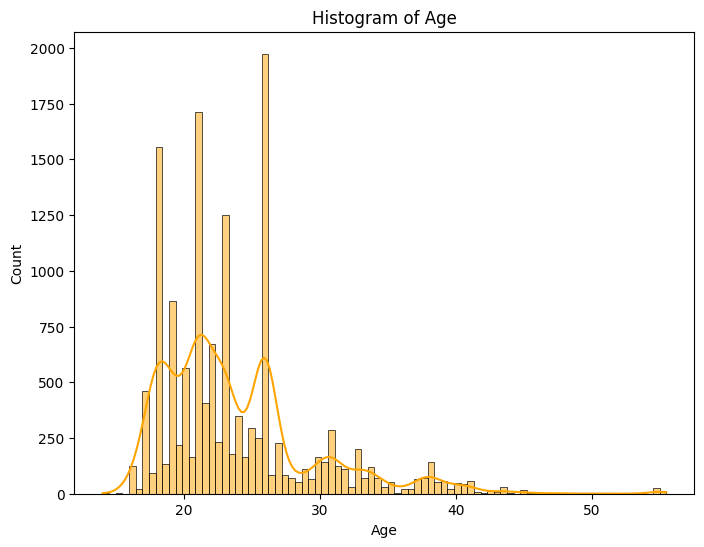

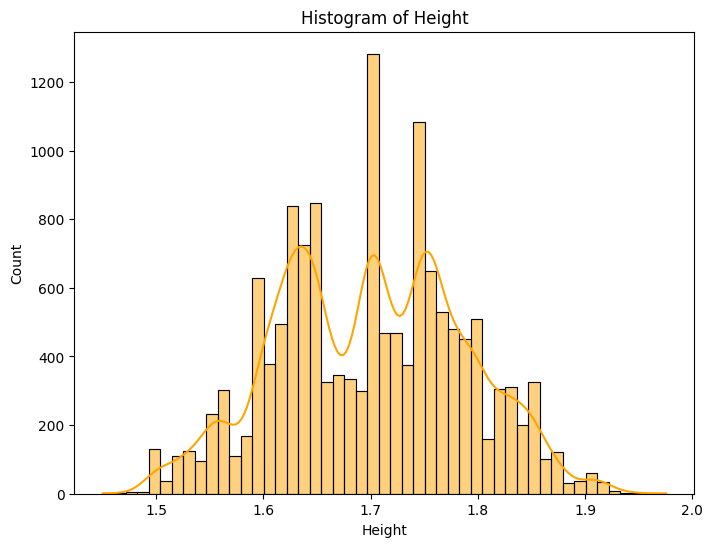

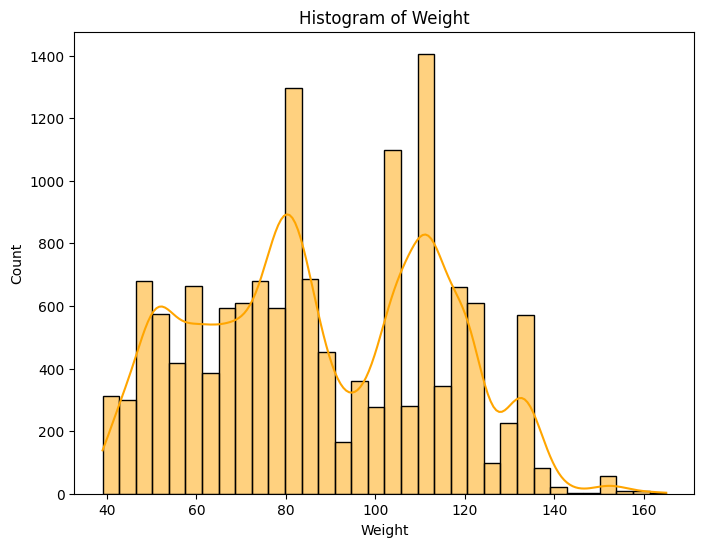

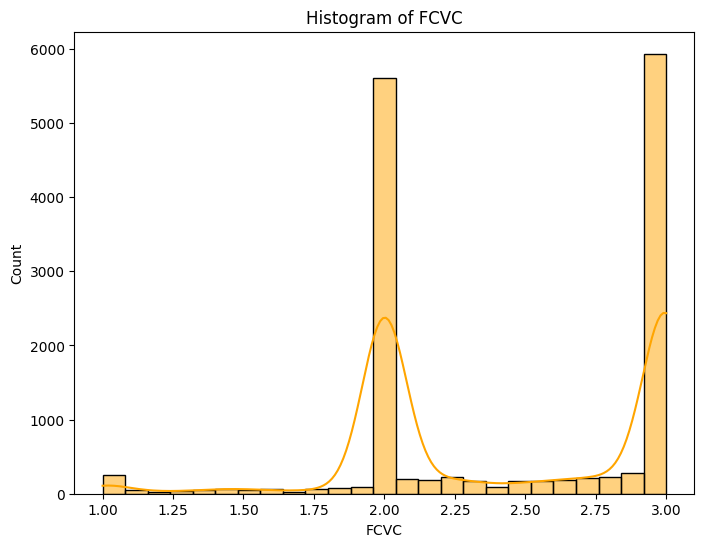

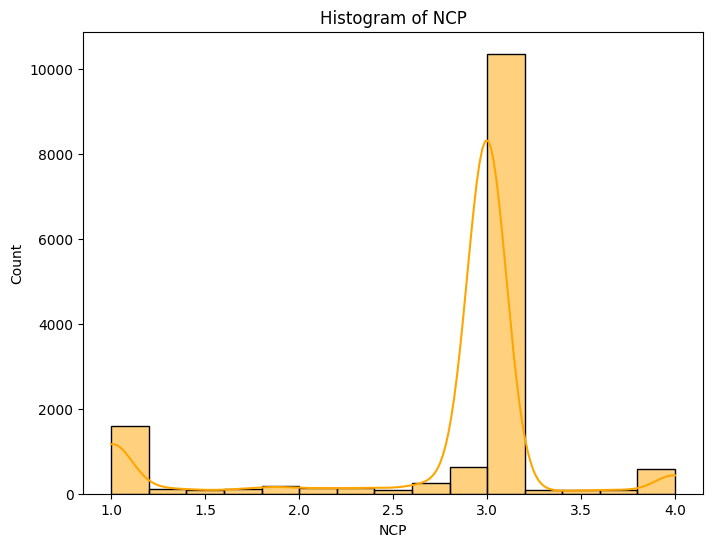

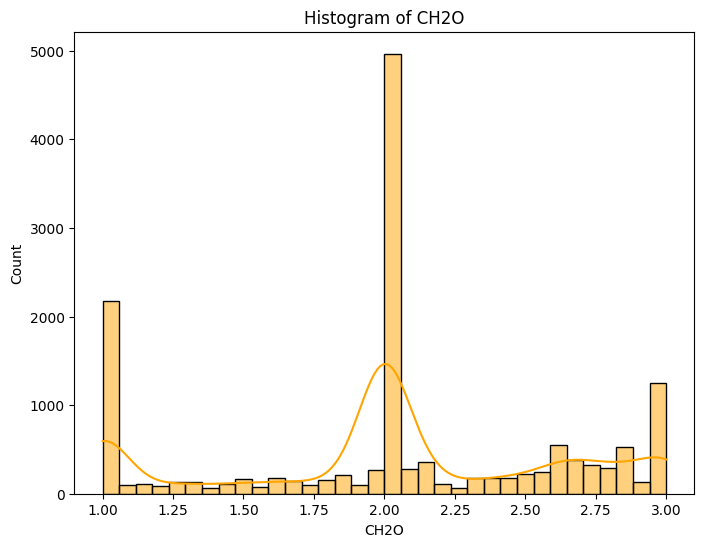

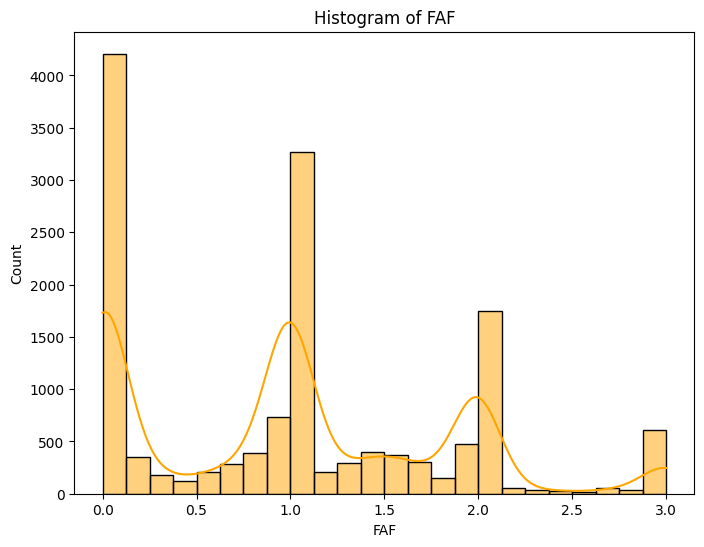

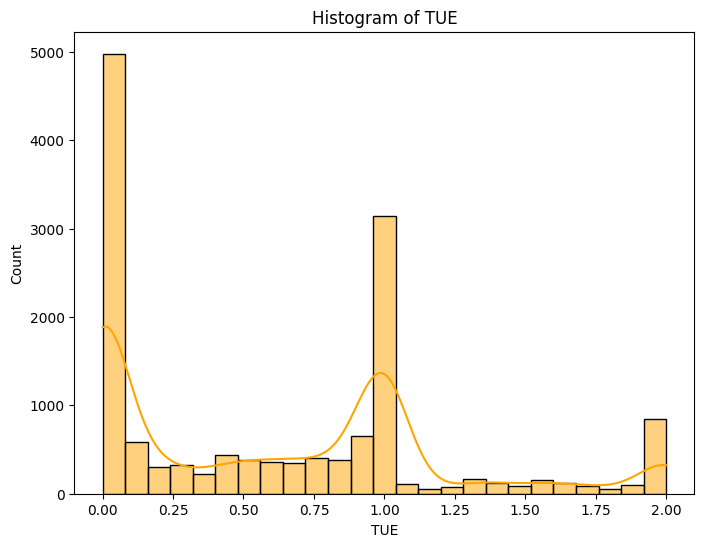

In [21]:
numeric_cols = x_train.select_dtypes(include = ["float64"]).columns

for col in numeric_cols :
    plt.figure(figsize=(8,6))
    sns.histplot(data = x_train , x= col , kde=True , color = 'orange' )
    plt.title(f"Histogram of {col}")
    plt.show()

- **Most ages are concentrated around 20 years old**, indicating that this age group is the most engaged in measuring their weight and health.  
- **Height follows a normal distribution**, which is expected in human populations.  
- **Weight shows a multimodal distribution**, which is natural considering height variations among individuals, as each height group may have a different weight distribution.  


`#` Categorical:

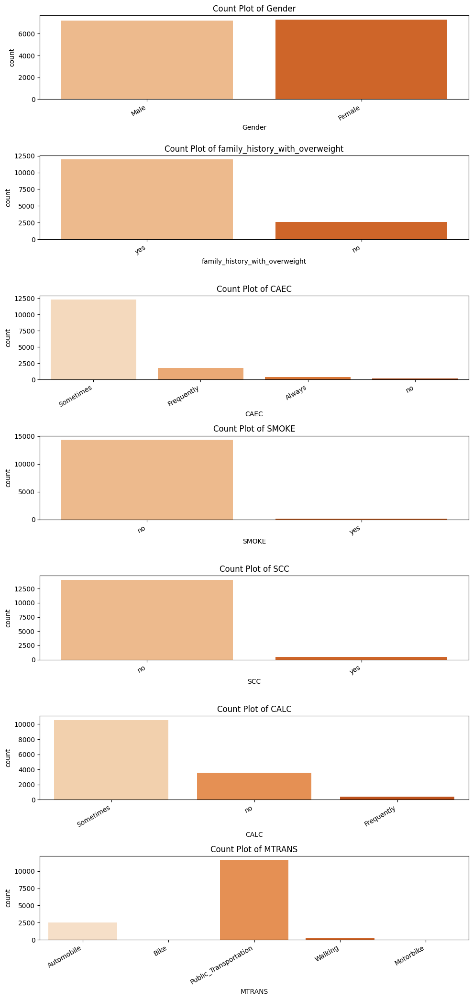

In [59]:
plt.figure(figsize=(10, len(columns_list) * 3))
for i, col in enumerate(columns_list, 1):
    plt.subplot(len(columns_list), 1, i)
    sns.countplot(data=x_train, x=col, palette='Oranges')
    plt.title(f"Count Plot of {col}")
    plt.xticks(rotation=30, ha='right')

plt.tight_layout()
plt.show()

---
### <u>Check outliers:</u>

In [29]:
numeric_cols = x_train.select_dtypes(include=["float64"])

Q1 = numeric_cols.quantile(0.25)
Q3 = numeric_cols.quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_mask = (numeric_cols < lower_bound) | (numeric_cols > upper_bound)

outlier_counts = outliers_mask.sum(axis=0)

total_rows = numeric_cols.shape[0]
outlier_percentage = (outlier_counts / total_rows) * 100

outliers_summary = pd.DataFrame({
    "Number of Outliers": outlier_counts,
    "Outlier Percentage": outlier_percentage
})

outliers_summary.style.background_gradient(cmap='Oranges')

,Number of Outliers,Outlier Percentage
Age,762,5.244322
Height,2,0.013765
Weight,0,0.000000
FCVC,0,0.000000
NCP,4228,29.098417
CH2O,0,0.000000
FAF,0,0.000000
TUE,0,0.000000


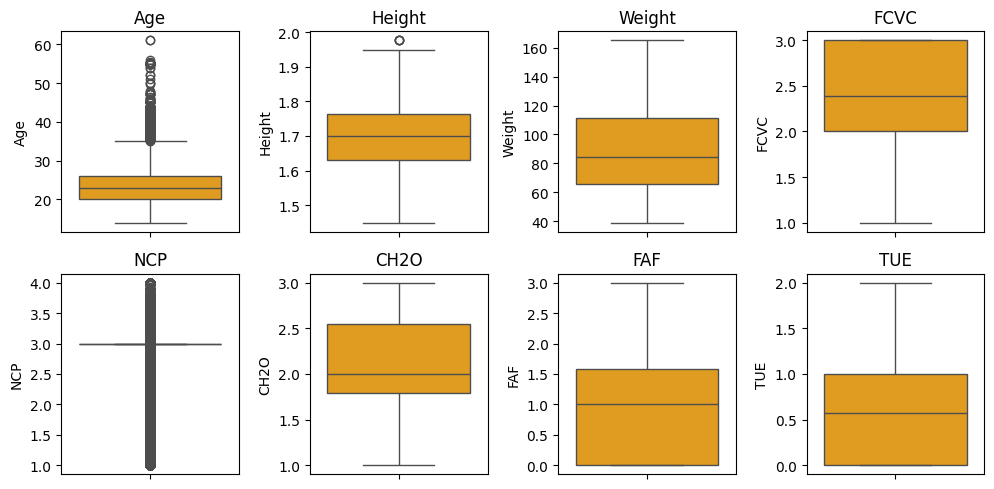

In [37]:
num = x.select_dtypes('number')

fig, axes = plt.subplots(2, 4, figsize=(10, 5))

# Flatten the axes array for easy iteration, and avoid making nested loop.
axes = axes.flatten()

# Plot boxplots for each feature
for i, column in enumerate(num.columns):
    sns.boxplot(num[column], ax = axes[i], color ='orange')
    axes[i].set_title(column)

# Adjust layout
plt.tight_layout()
plt.show();

In [51]:
#Check for extreme outliers
Q1 = num.quantile(0.25)
Q3 = num.quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 3 * IQR
upper_bound = Q3 + 3 * IQR

outliers_mask = (num < lower_bound) | (num > upper_bound)

outlier_counts = outliers_mask.sum(axis=0)

total_rows = num.shape[0]
outlier_percentage = (outlier_counts / total_rows) * 100

outliers_summary = pd.DataFrame({
    "Number of Outliers": outlier_counts,
    "Outlier Percentage": outlier_percentage
})

outliers_summary.style.background_gradient(cmap='hot')

,Number of Outliers,Outlier Percentage
Age,70,0.481762
Height,0,0.000000
Weight,0,0.000000
FCVC,0,0.000000
NCP,4228,29.098417
CH2O,0,0.000000
FAF,0,0.000000
TUE,0,0.000000


- `NCP` has many outliers,but many people have three meals, So it is really outliers? 🤔


In [52]:
#Check for NCP
x_train['NCP'].unique()

array([3.      , 1.134042, 3.471536, 2.326233, 1.      , 2.395785,
       1.496776, 1.355354, 4.      , 2.956422, 2.669766, 1.894384,
       2.581015, 2.9796  , 1.411685, 2.463113, 2.475228, 2.036794,
       2.141839, 2.973476, 2.983297, 2.845307, 1.672706, 3.884861,
       2.372339, 1.104642, 2.977909, 2.625942, 1.068196, 2.696051,
       3.715118, 2.993623, 2.029858, 2.358298, 2.989791, 1.134321,
       1.458507, 2.812283, 3.985442, 2.937607, 1.193589, 2.473911,
       2.954446, 1.07976 , 2.043359, 2.996834, 3.245148, 1.171027,
       1.288716, 1.194815, 2.083831, 2.608416, 3.03779 , 1.882158,
       1.773916, 3.762778, 2.884848, 1.355752, 2.967089, 3.371832,
       3.047959, 1.667596, 2.119682, 2.475444, 3.576103, 2.711238,
       2.122545, 2.996543, 1.273128, 1.818026, 1.717608, 2.977999,
       2.911568, 2.87747 , 2.13229 , 1.317884, 2.      , 2.271734,
       2.270546, 1.131695, 1.154318, 2.644692, 2.270163, 2.806566,
       3.45259 , 3.087544, 3.715148, 2.832018, 2.677693, 1.009

In [53]:
x_train['NCP']=np.round(x_train['NCP'])

In [54]:
x_train['NCP'].value_counts()

,count
NCP,
3.0,11395
1.0,1765
4.0,715
2.0,655


- Due to that there are 11395 belongs to 3 it looks every thing ather is outlier 👧

In [38]:
report = ProfileReport(x_train, title="Data Report", explorative=True)
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## -<u>`Insights`:</u>

### General Overview  
- The dataset contains **14,530 observations** and **16 variables**.  
- There are **no missing values** and **no duplicate rows**, ensuring data completeness and uniqueness.   
- Variable types include **4 categorical**, **8 numeric**, and **4 boolean** variables.  

### Data Quality & Issues  
#### 1. ** Missing data Issues:**
- No missing values across all columns.
#### 2. **  Imbalance Issues:**
- Most individuals consume high-calorie food frequently .
- Only 1.1% of respondents smoke (SMOKE), possibly indicating underreporting.
- SCC (Caloric Consumption Monitoring) is marked True in only 3.3% of cases, making it difficult to analyze.
#### 3. **Potential Data Entry Issues:**  
- **"Age"** has a minimum value of **14**, which may indicate the inclusion of underage individuals.  
- **"Weight"** ranges from **39 kg to 165.06 kg**, with some high values that may need verification.  
- **"Height"** ranges from **1.45 m to 1.98 m**, which appears reasonable but should be checked for outliers.  

### Observations :
- The dataset is **almost equally split** between genders (**Female, Male**).  
- **Mode of transportation** is dominated by **Public Transport **, followed by **Automobiles **.  
- **Food consumption between meals** is mostly reported as **"Sometimes" **.  

#### **Skewness & Distribution Analysis**  

- **Age distribution is right-skewed**, meaning there are more younger individuals and fewer older ones.  
- **Height appears normally distributed**, as expected in human populations.  
- **Weight is right-skewed**, indicating fewer individuals with very high weight.  
- **Vegetable consumption (FCVC) and water intake (CH2O) are left-skewed**, suggesting most people consume adequate amounts.  

---


### <u>Bivariate Data Visualizations :</u>

In [63]:
y_train.value_counts()

,count
NObeyesdad,
Obesity_Type_III,2838
Obesity_Type_II,2268
Normal_Weight,2152
Obesity_Type_I,2043
Overweight_Level_II,1753
Insufficient_Weight,1749
Overweight_Level_I,1727


`#` Numerical:

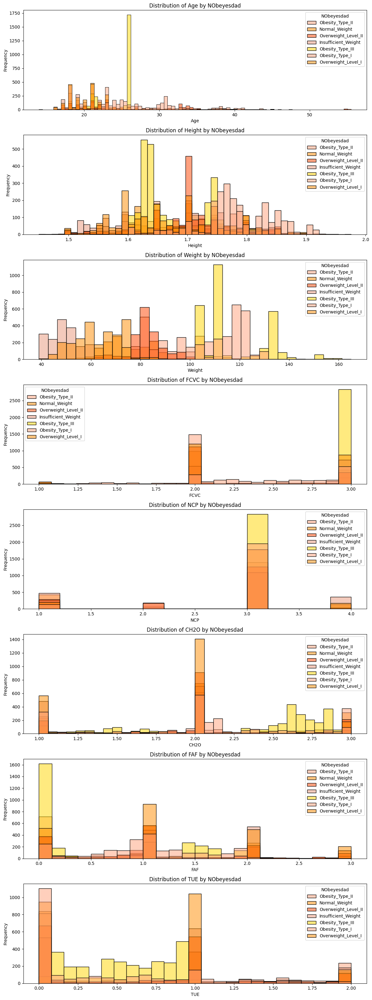

In [74]:
numerical_columns = x_train.select_dtypes(include=['int64', 'float64']).columns.tolist()
target = y_train

colors = ["#FFA07A", "#FF8C00", "#FF4500", "#E9967A", "#FFD700"]

plt.figure(figsize=(12, len(numerical_columns) * 4))

for i, col in enumerate(numerical_columns, 1):
    plt.subplot(len(numerical_columns), 1, i)
    sns.histplot(x=x_train[col], hue=target, palette=colors)
    plt.title(f"Distribution of {col} by {target.name}")
    plt.xlabel(col)
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

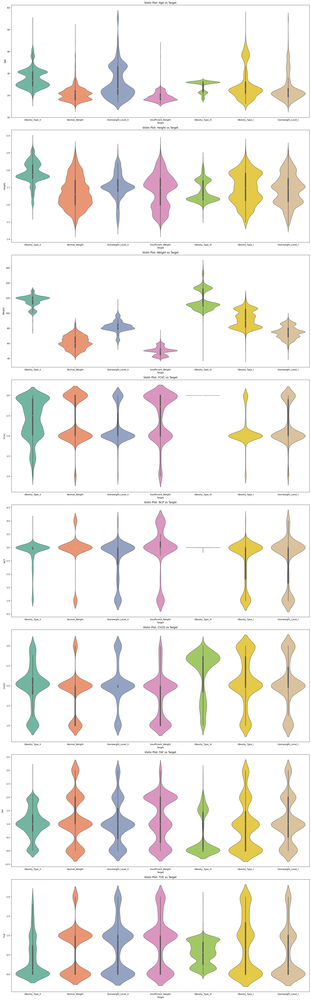

In [60]:
plt.figure(figsize=(20, 8 * len(num.columns)))
for i, col in enumerate(num.columns, 1):
    plt.subplot(len(num.columns), 1, i)
    sns.violinplot(x=y_train, y=num[col], palette='Set2')
    plt.title(f'Violin Plot: {col} vs Target')
    plt.xlabel('Target')
    plt.ylabel(col)

plt.tight_layout()
plt.show()

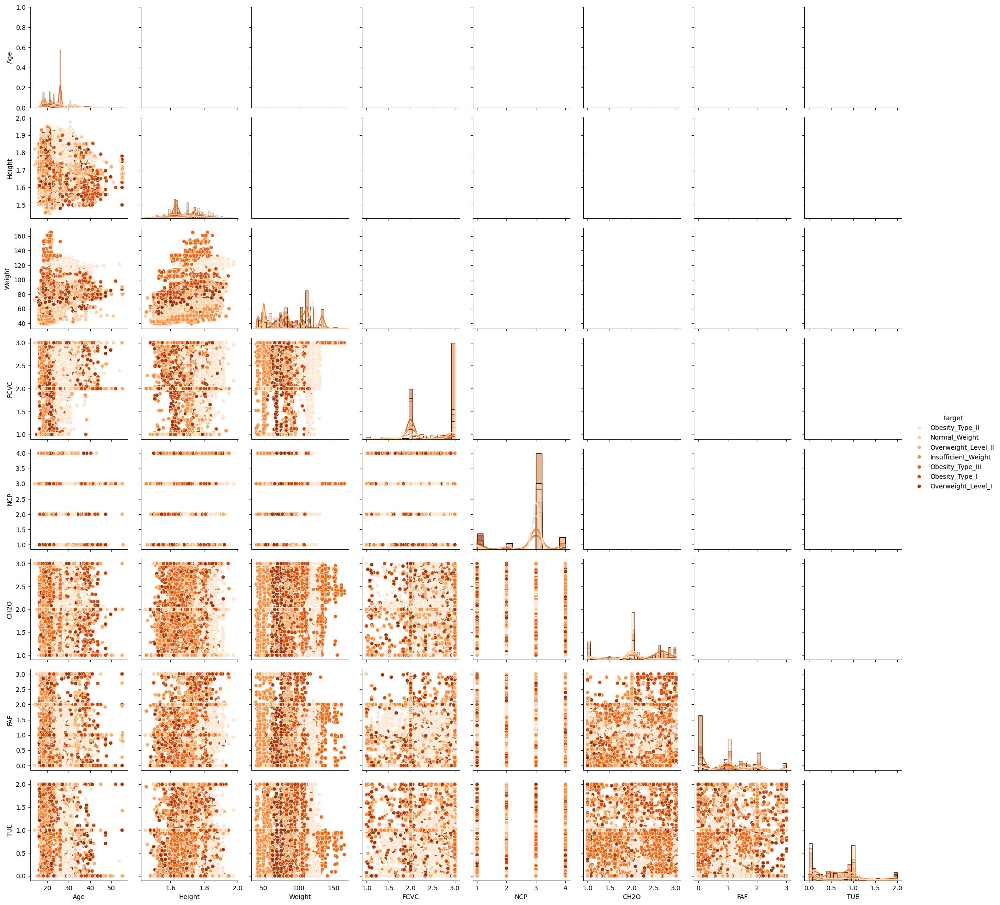

In [72]:
plot = sns.PairGrid(x_train.assign(target=y_train), vars=numerical_columns, hue='target', palette="Oranges")
plot.map_lower(sns.scatterplot)
plot.map_diag(sns.histplot,kde=True)
plot.add_legend()

plt.show()

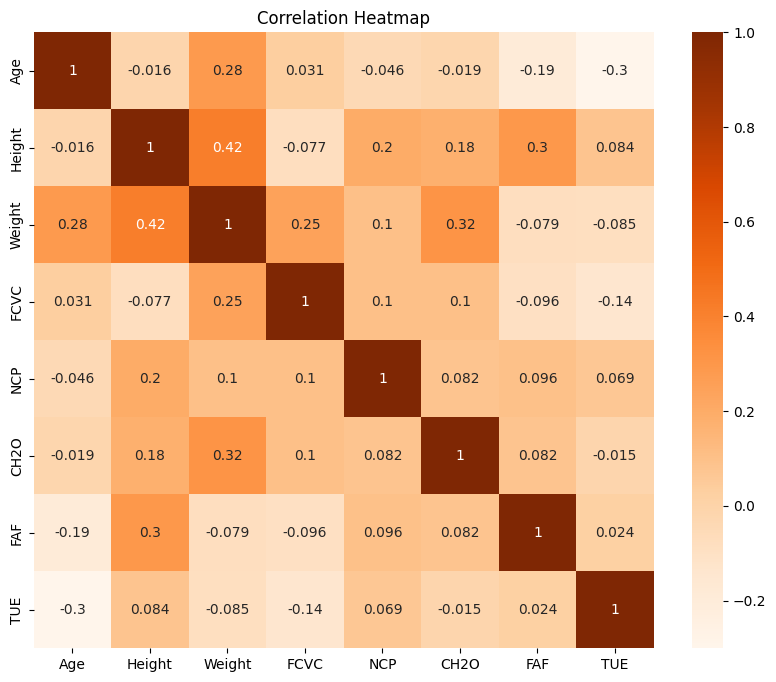

In [73]:
correlation = num.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation, annot=True, cmap='Oranges')
plt.title('Correlation Heatmap')
plt.show();


- There is no storng correlation between columns.

`#` Categorical:

In [55]:
categrical = x_train.select_dtypes('object')

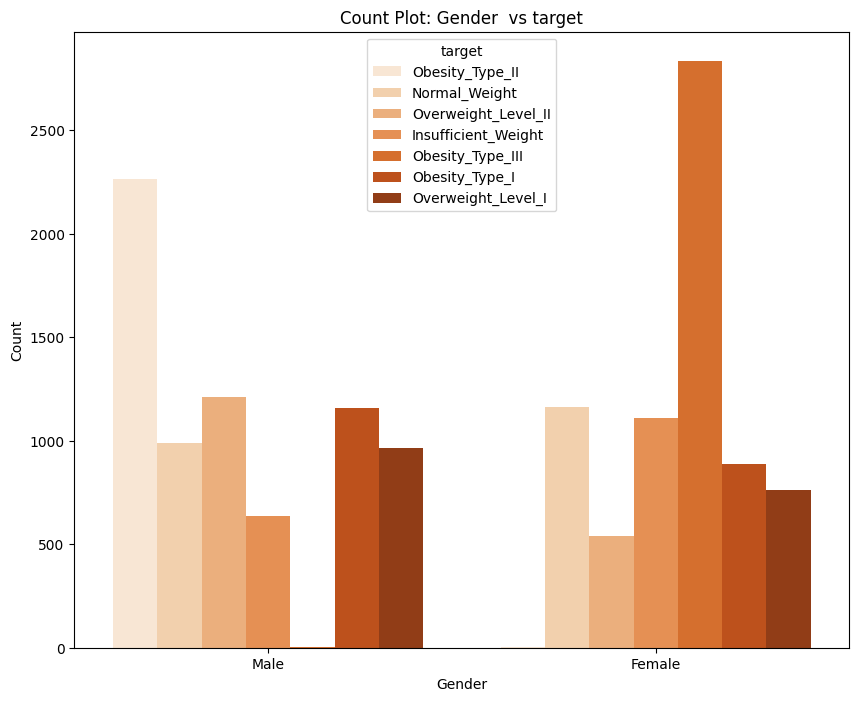

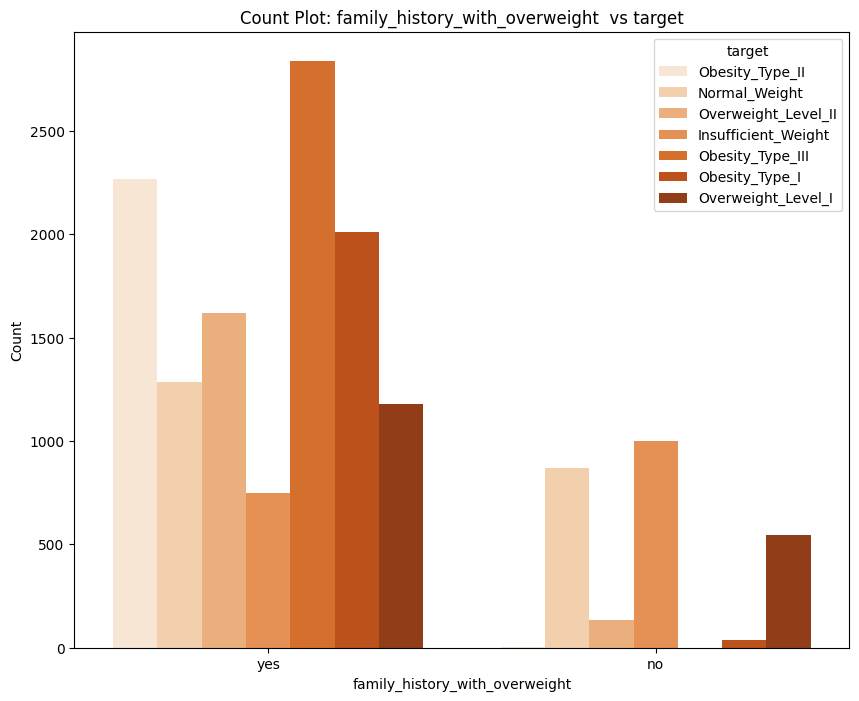

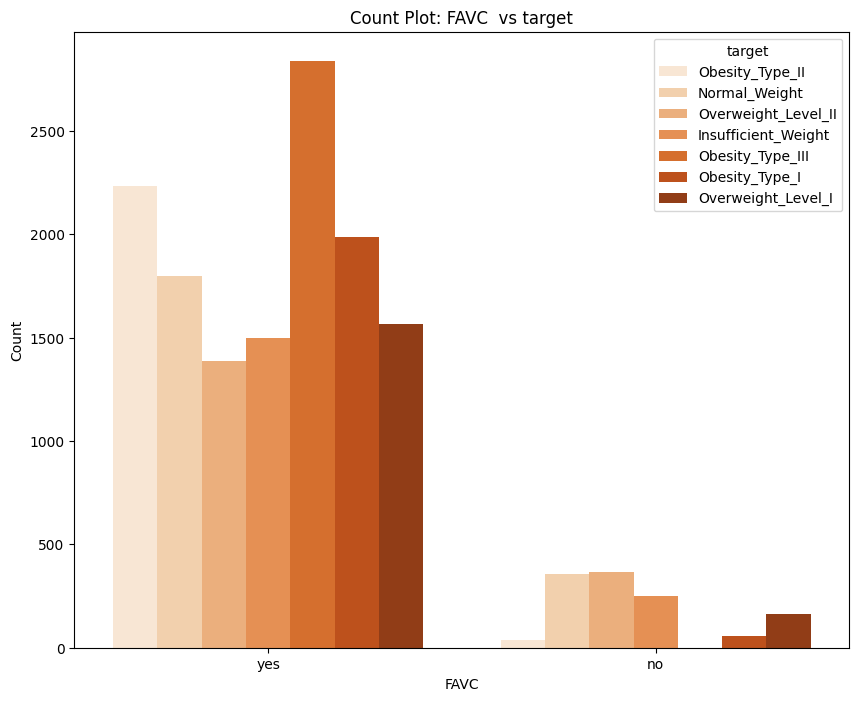

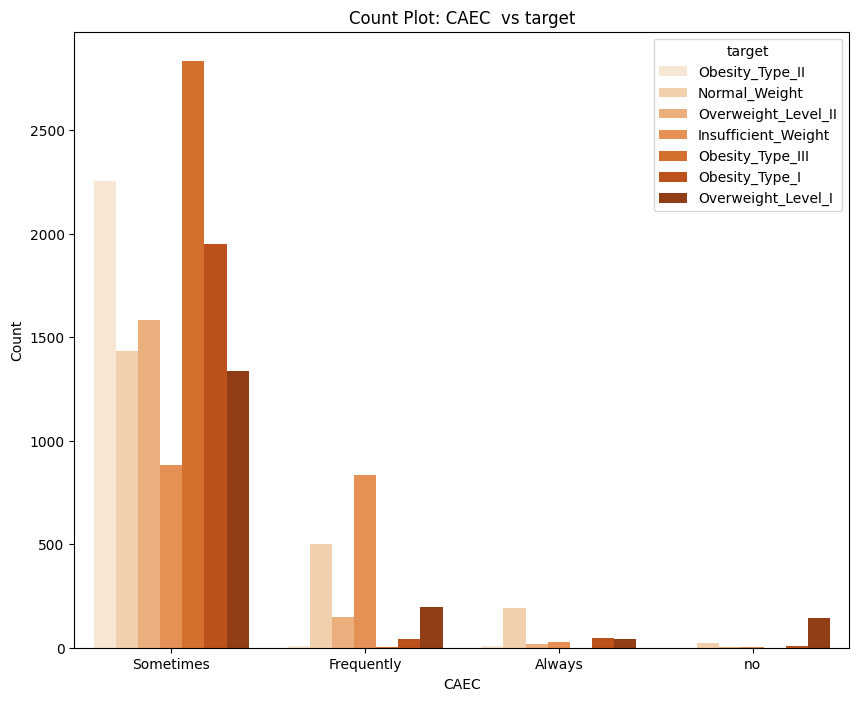

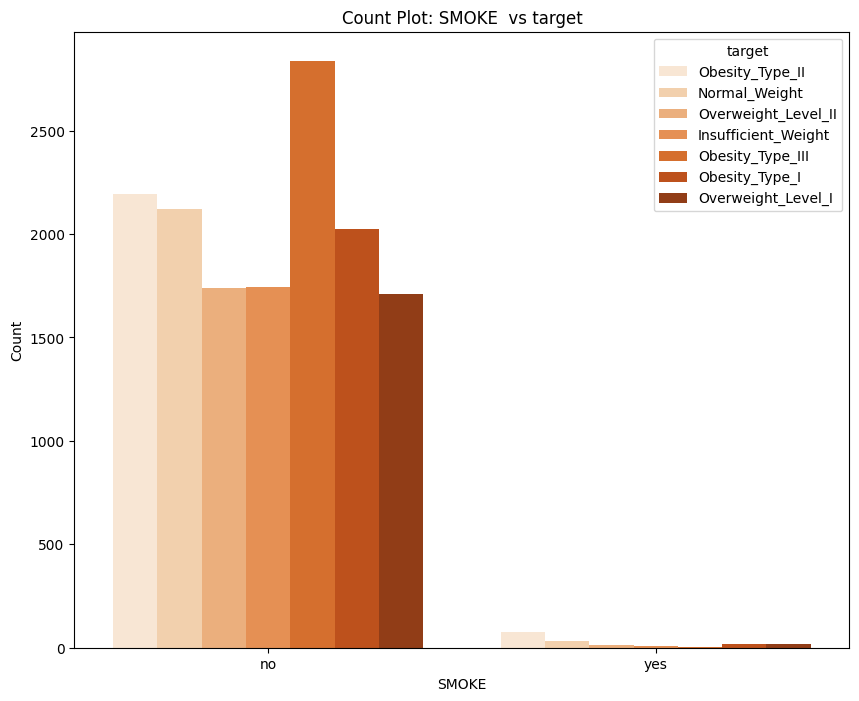

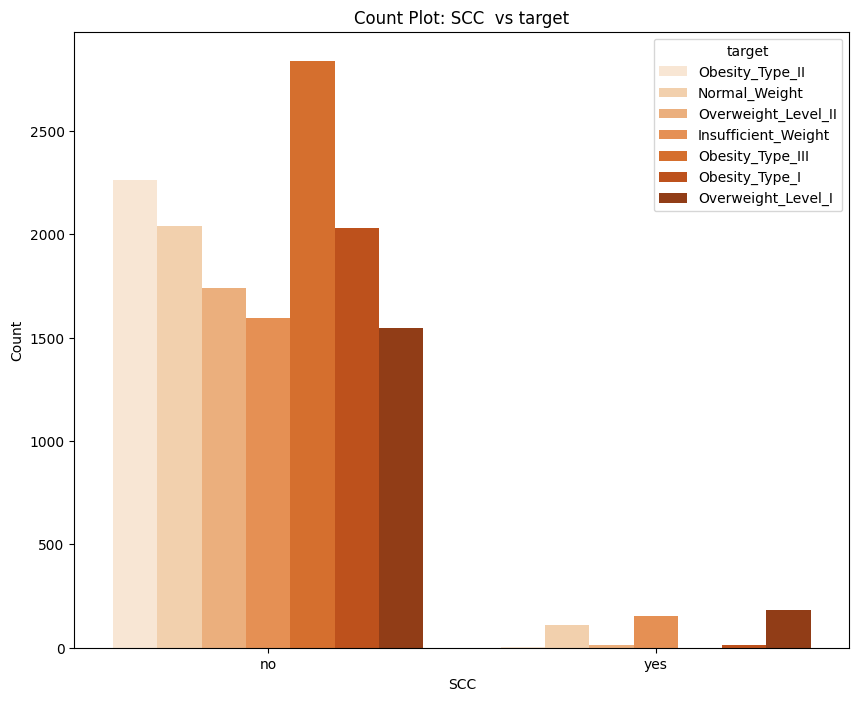

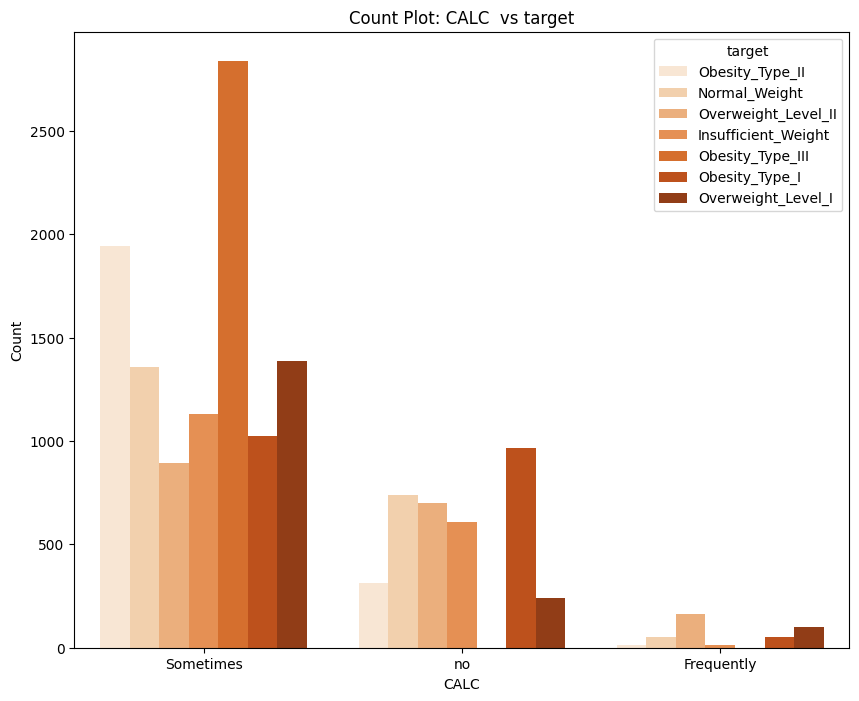

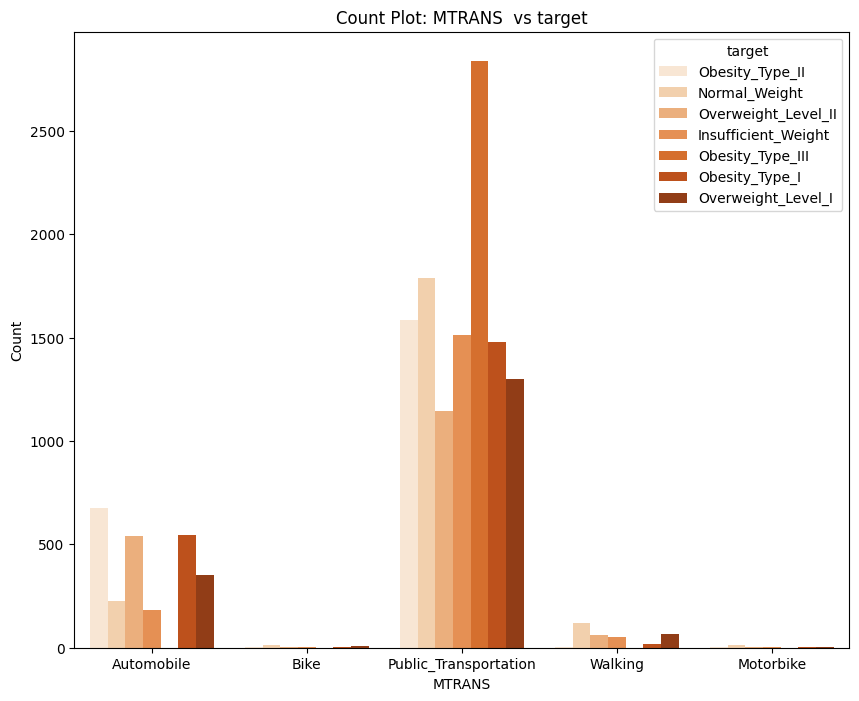

In [56]:
for i in categrical.columns:
  plt.figure(figsize=(10, 8))
  sns.countplot(x=x_train[i], hue= y_train, palette='Oranges')
  plt.title(f'Count Plot: {i}  vs target')
  plt.xlabel(i)
  plt.ylabel('Count')
  plt.legend(title='target')
  plt.show();

----------------

# `06` Data Preparation

## `i` Feature Engineering

In [75]:
for df in [x_train]:
    x_train['BMI'] = x_train['Weight']/x_train['Height']**2

In [76]:
x_train.drop(columns=['Weight','Height'],inplace=True)

In [77]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14530 entries, 3969 to 10741
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          14530 non-null  object 
 1   Age                             14530 non-null  float64
 2   family_history_with_overweight  14530 non-null  object 
 3   FAVC                            14530 non-null  object 
 4   FCVC                            14530 non-null  float64
 5   NCP                             14530 non-null  float64
 6   CAEC                            14530 non-null  object 
 7   SMOKE                           14530 non-null  object 
 8   CH2O                            14530 non-null  float64
 9   SCC                             14530 non-null  object 
 10  FAF                             14530 non-null  float64
 11  TUE                             14530 non-null  float64
 12  CALC                            14

<Axes: xlabel='BMI', ylabel='Count'>

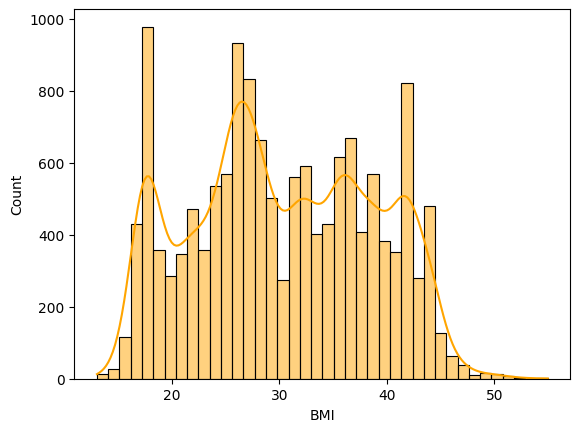

In [78]:
sns.histplot(data = x_train , x= 'BMI' , kde=True , color = 'orange' )

## `ii` Data Cleaning

In [ ]:
# Do not forget to ensure that each column is deeply cleaned.

## `iii` Encoding

In [80]:
category = [['no','Sometimes','Frequently','Always']]
encoder_CAEC = OrdinalEncoder(categories=category)
x_train['CAEC'] = encoder_CAEC.fit_transform(x_train[['CAEC']])

In [81]:
category =[['no','yes']]
encoder_history = OrdinalEncoder(categories=category)
x_train['family_history_with_overweight'] = encoder_history.fit_transform(x_train[['family_history_with_overweight']])

In [84]:
category =[['Walking' ,'Bike','Motorbike','Public_Transportation','Automobile']]
encoder_MTRANS = OrdinalEncoder(categories=category)
x_train['MTRANS']=encoder_MTRANS.fit_transform(x_train[['MTRANS']])

In [ ]:
def data_preprocessing(data):
  data['BMI'] = data['Weight']/data['Height']**2
  data.drop(columns=['Weight','Height'],inplace=True)
  data['NCP'] = np.round(data['NCP'])
  encoder
  return data
